In [ ]:
import numpy as np
from matplotlib import pyplot as plt

Here's the idea: we'll do something kind of like a convolutional cellular automata. You have a grid you can initialize randomly, or to zeros, or to zeros with a seed in the middle (what I'm hoping to do). Then, for each cell on the grid, you apply a kernel (like a 3x3 kernel) that looks at that cell and its neighbors and outputs a delta value that should be added or subtracted to the current value in the cell. We can clamp the values to -1 to +1 and we can render this as an image.

The idea is that we'll initialize the grid, apply our convolutional update, but we'll only apply it to a random 50 of the cells at any time. Although we should have a toggle for this whether we apply it to all of them, or just 50%, or none, or some other percentage. Then, we will make a little video animation of this algorithm being applied 200 steps. Could you get this started? Use numpy.

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Let's start building this step by step. First, let's create a basic grid initialization function:

```python
def init_grid(sz, mode='random', seed_val=1.0):
    if mode == 'random': return np.random.uniform(-1, 1, (sz, sz))
    if mode == 'zeros': return np.zeros((sz, sz))
    if mode == 'seed':
        grid = np.zeros((sz, sz))
        grid[sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")

init_grid(64, 'seed')
```

In [ ]:
def init_grid(sz, mode='random', seed_val=1.0):
    if mode == 'random': return np.random.uniform(-1, 1, (sz, sz))
    if mode == 'zeros': return np.zeros((sz, sz))
    if mode == 'seed':
        grid = np.zeros((sz, sz))
        grid[sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")

grid = init_grid(64, 'seed')

Continue

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Now let's create a function to apply a convolutional kernel to compute deltas:

```python
def apply_kernel(grid, kernel):
    h,w = grid.shape
    kh,kw = kernel.shape
    ph,pw = kh//2, kw//2
    padded = np.pad(grid, ((ph,ph),(pw,pw)), mode='wrap')
    deltas = np.zeros_like(grid)
    for i in range(h):
        for j in range(w):
            patch = padded[i:i+kh, j:j+kw]
            deltas[i,j] = np.sum(patch * kernel)
    return deltas

kernel = np.random.randn(3,3)
apply_kernel(grid, kernel)
```

In [ ]:
def apply_kernel(grid, kernel):
    h,w = grid.shape
    kh,kw = kernel.shape
    ph,pw = kh//2, kw//2
    padded = np.pad(grid, ((ph,ph),(pw,pw)), mode='wrap')
    deltas = np.zeros_like(grid)
    for i in range(h):
        for j in range(w):
            patch = padded[i:i+kh, j:j+kw]
            deltas[i,j] = np.sum(patch * kernel)
    return deltas

kernel = np.random.randn(3,3)
out = apply_kernel(grid, kernel)

Continue

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Now let's create a function to update the grid with a specified percentage of cells:

```python
def update_grid(grid, kernel, pct=0.5):
    deltas = apply_kernel(grid, kernel)
    n_cells = int(grid.size * pct)
    mask = np.zeros(grid.size, dtype=bool)
    mask[:n_cells] = True
    np.random.shuffle(mask)
    mask = mask.reshape(grid.shape)
    grid = grid.copy()
    grid[mask] += deltas[mask]
    return np.clip(grid, -1, 1)

grid = update_grid(grid, kernel, pct=0.5)
grid.min(), grid.max()
```

In [ ]:
def update_grid(grid, kernel, pct=0.5):
    deltas = apply_kernel(grid, kernel)
    n_cells = int(grid.size * pct)
    mask = np.zeros(grid.size, dtype=bool)
    mask[:n_cells] = True
    np.random.shuffle(mask)
    mask = mask.reshape(grid.shape)
    grid = grid.copy()
    grid[mask] += deltas[mask]
    return np.clip(grid, -1, 1)

grid = update_grid(grid, kernel, pct=0.5)
grid.min(), grid.max()

(0.0, 1.0)

Continue

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Now let's create a function to run the simulation for multiple steps and collect frames:

```python
def simulate(sz, kernel, n_steps=200, init_mode='seed', pct=0.5):
    grid = init_grid(sz, init_mode)
    frames = [grid.copy()]
    for _ in range(n_steps):
        grid = update_grid(grid, kernel, pct)
        frames.append(grid.copy())
    return np.array(frames)

frames = simulate(64, kernel, n_steps=200, pct=0.5)
frames.shape
```

In [ ]:
def simulate(sz, kernel, n_steps=200, init_mode='seed', pct=0.5):
    grid = init_grid(sz, init_mode)
    frames = [grid.copy()]
    for _ in range(n_steps):
        grid = update_grid(grid, kernel, pct)
        frames.append(grid.copy())
    return np.array(frames)

frames = simulate(64, kernel, n_steps=200, pct=0.5)
frames.shape

(201, 64, 64)

Continue

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Now let's create a function to visualize and save the animation:

```python
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_frames(frames, interval=50, cmap='RdBu'):
    fig,ax = plt.subplots(figsize=(6,6))
    ax.axis('off')
    im = ax.imshow(frames[0], cmap=cmap, vmin=-1, vmax=1)
    def update(frame): im.set_array(frames[frame]); return [im]
    anim = FuncAnimation(fig, update, frames=len(frames), interval=interval, blit=True)
    plt.close()
    return anim

anim = animate_frames(frames)
HTML(anim.to_html5_video())
```

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_frames(frames, interval=50, cmap='RdBu'):
    fig,ax = plt.subplots(figsize=(6,6))
    ax.axis('off')
    im = ax.imshow(frames[0], cmap=cmap, vmin=-1, vmax=1)
    def update(frame): im.set_array(frames[frame]); return [im]
    anim = FuncAnimation(fig, update, frames=len(frames), interval=interval, blit=True)
    plt.close()
    return anim

In [ ]:
anim = animate_frames(frames)
HTML(anim.to_html5_video())

Fantastic! Now for part 2: I want to initialize the grid small, initialize a kernel, and apply N update steps. Then upsample the grid to 2X the resolution and apply N more steps, repeating 5 times then showing the final image.

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

Let's create a function to upsample the grid and run the multi-scale simulation:

```python
def upsample_grid(grid, factor=2):
    return np.repeat(np.repeat(grid, factor, axis=0), factor, axis=1)

def multiscale_simulate(init_sz, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5):
    grid = init_grid(init_sz, 'seed')
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale): grid = update_grid(grid, kernel, pct)
        if scale < n_scales - 1: grid = upsample_grid(grid)
    return grid

result = multiscale_simulate(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()
result.shape
```

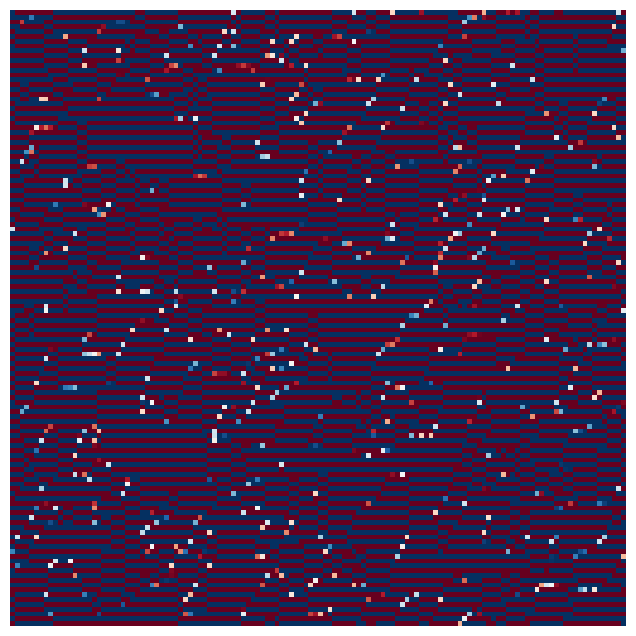

(128, 128)

In [ ]:
def upsample_grid(grid, factor=2):
    return np.repeat(np.repeat(grid, factor, axis=0), factor, axis=1)

def multiscale_simulate(init_sz, kernel, n_steps_per_scale=10, n_scales=6, pct=0.5):
    grid = init_grid(init_sz, 'seed')
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale): grid = update_grid(grid, kernel, pct)
        if scale < n_scales - 1: grid = upsample_grid(grid)
    return grid

result = multiscale_simulate(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()
result.shape

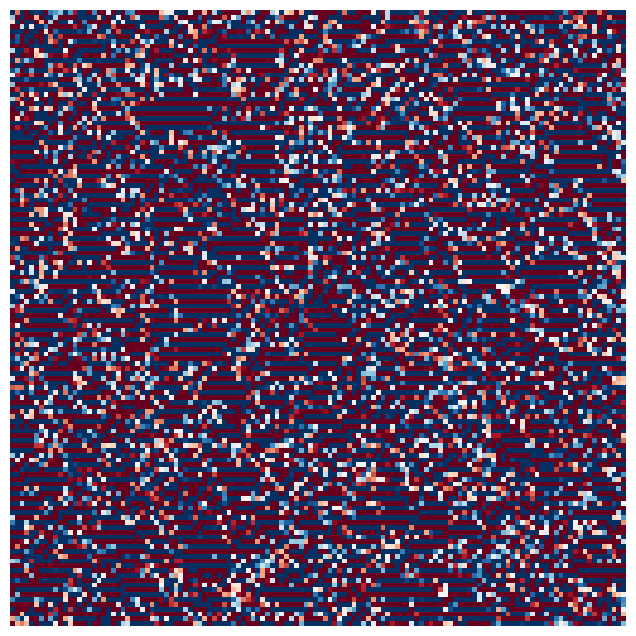

In [ ]:
kernel = np.random.randn(3,3)
result = multiscale_simulate(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off');

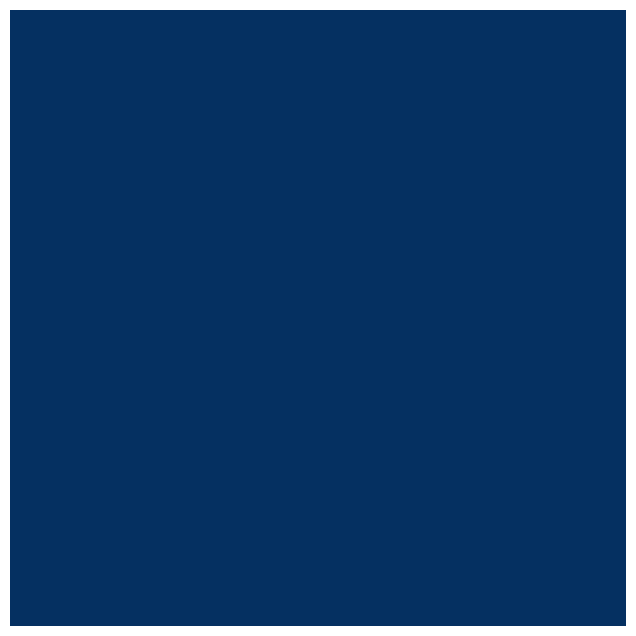

In [ ]:
kernel = np.random.randn(3,3)
result = multiscale_simulate(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off');

Re-write all this to use pytorch and do the update with a conv (that wraps around the edges). Output multiple concise code blocks that, when run, replicate the above but without the for loops and jank.

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

```python
import torch
import torch.nn.functional as F
```

```python
def init_grid_torch(sz, mode='random', seed_val=1.0, device='cpu'):
    if mode == 'random': return torch.rand(1, 1, sz, sz, device=device) * 2 - 1
    if mode == 'zeros': return torch.zeros(1, 1, sz, sz, device=device)
    if mode == 'seed':
        grid = torch.zeros(1, 1, sz, sz, device=device)
        grid[0, 0, sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")
```

```python
def circular_pad(x, pad):
    return F.pad(x, (pad, pad, pad, pad), mode='circular')

def apply_kernel_torch(grid, kernel):
    padded = circular_pad(grid, kernel.shape[-1]//2)
    return F.conv2d(padded, kernel)
```

```python
def update_grid_torch(grid, kernel, pct=0.5):
    deltas = apply_kernel_torch(grid, kernel)
    if pct < 1.0:
        mask = torch.rand_like(grid) < pct
        grid = grid + deltas * mask
    else:
        grid = grid + deltas
    return torch.clamp(grid, -1, 1)
```

```python
def simulate_torch(sz, kernel, n_steps=200, init_mode='seed', pct=0.5, device='cpu'):
    grid = init_grid_torch(sz, init_mode, device=device)
    frames = [grid[0,0].cpu().numpy()]
    for _ in range(n_steps):
        grid = update_grid_torch(grid, kernel, pct)
        frames.append(grid[0,0].cpu().numpy())
    return np.array(frames)
```

```python
def upsample_grid_torch(grid, factor=2):
    return F.interpolate(grid, scale_factor=factor, mode='nearest')

def multiscale_simulate_torch(init_sz, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, device='cpu'):
    grid = init_grid_torch(init_sz, 'seed', device=device)
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale):
            grid = update_grid_torch(grid, kernel, pct)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    return grid[0,0].cpu().numpy()
```

```python
kernel = torch.randn(1, 1, 3, 3)
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()
```

In [ ]:
import torch
import torch.nn.functional as F

In [ ]:
def init_grid_torch(sz, mode='random', seed_val=1.0, device='cpu'):
    if mode == 'random': return torch.rand(1, 1, sz, sz, device=device) * 2 - 1
    if mode == 'zeros': return torch.zeros(1, 1, sz, sz, device=device)
    if mode == 'seed':
        grid = torch.zeros(1, 1, sz, sz, device=device)
        grid[0, 0, sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")

In [ ]:
def circular_pad(x, pad):
    return F.pad(x, (pad, pad, pad, pad), mode='circular')

def apply_kernel_torch(grid, kernel):
    padded = circular_pad(grid, kernel.shape[-1]//2)
    return F.conv2d(padded, kernel)

In [ ]:
def update_grid_torch(grid, kernel, pct=0.5):
    deltas = apply_kernel_torch(grid, kernel)
    if pct < 1.0:
        mask = torch.rand_like(grid) < pct
        grid = grid + deltas * mask
    else:
        grid = grid + deltas
    return torch.clamp(grid, -1, 1)

In [ ]:
def simulate_torch(sz, kernel, n_steps=200, init_mode='seed', pct=0.5, device='cpu'):
    grid = init_grid_torch(sz, init_mode, device=device)
    frames = [grid[0,0].cpu().numpy()]
    for _ in range(n_steps):
        grid = update_grid_torch(grid, kernel, pct)
        frames.append(grid[0,0].cpu().numpy())
    return np.array(frames)

In [ ]:
def upsample_grid_torch(grid, factor=2):
    return F.interpolate(grid, scale_factor=factor, mode='nearest')

def multiscale_simulate_torch(init_sz, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, device='cpu'):
    grid = init_grid_torch(init_sz, 'seed', device=device)
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale):
            grid = update_grid_torch(grid, kernel, pct)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    return grid[0,0].cpu().numpy()

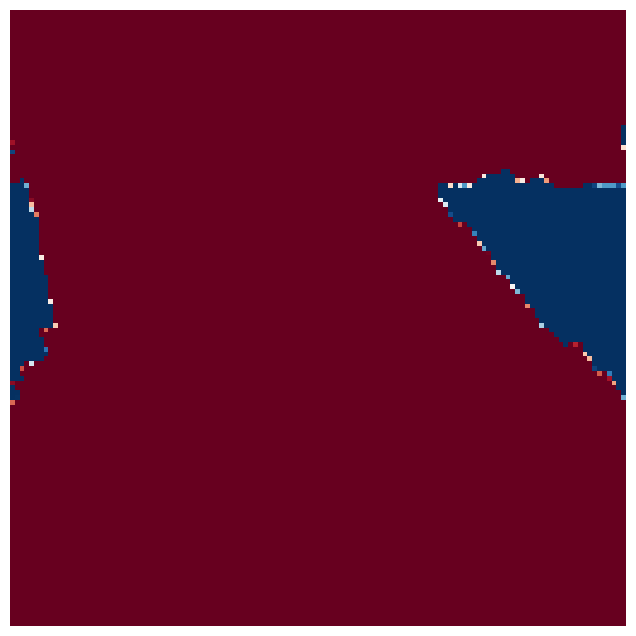

In [ ]:
kernel = torch.randn(1, 1, 3, 3)
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()

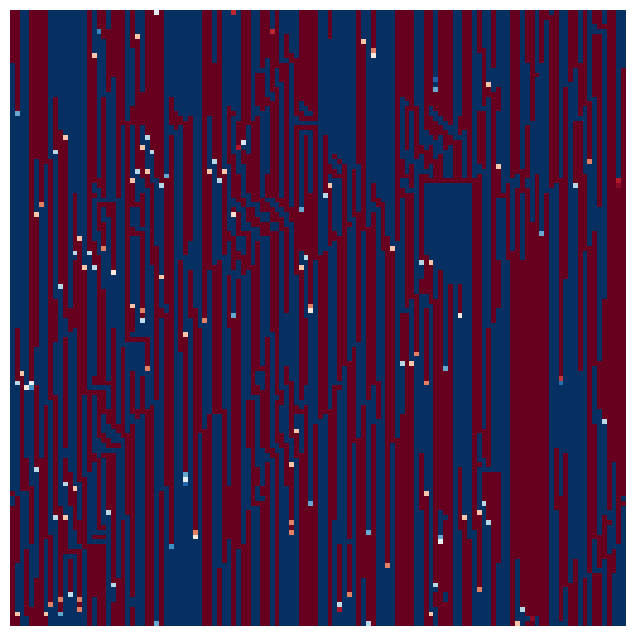

In [ ]:
kernel = torch.randn(1, 1, 3, 3)
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5)
plt.figure(figsize=(8,8))
plt.imshow(result, cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()

Make a multi-color version: use a 3-channel grid and a 3-channel kernel. Also, scale the updates to make them a lot smaller per step with an optional update_scale param

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

```python
def init_grid_torch(sz, mode='random', seed_val=1.0, device='cpu', channels=3):
    if mode == 'random': return torch.rand(1, channels, sz, sz, device=device) * 2 - 1
    if mode == 'zeros': return torch.zeros(1, channels, sz, sz, device=device)
    if mode == 'seed':
        grid = torch.zeros(1, channels, sz, sz, device=device)
        grid[0, :, sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")
```

```python
def update_grid_torch(grid, kernel, pct=0.5, update_scale=0.1):
    deltas = apply_kernel_torch(grid, kernel) * update_scale
    if pct < 1.0:
        mask = torch.rand_like(grid) < pct
        grid = grid + deltas * mask
    else:
        grid = grid + deltas
    return torch.clamp(grid, -1, 1)
```

```python
def multiscale_simulate_torch(init_sz, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, update_scale=0.1, device='cpu'):
    channels = kernel.shape[1]
    grid = init_grid_torch(init_sz, 'seed', device=device, channels=channels)
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale):
            grid = update_grid_torch(grid, kernel, pct, update_scale)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    return grid[0].permute(1, 2, 0).cpu().numpy()
```

```python
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, update_scale=0.1)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()
```

In [ ]:
def init_grid_torch(sz, mode='random', seed_val=1.0, device='cpu', channels=3):
    if mode == 'random': return torch.rand(1, channels, sz, sz, device=device) * 2 - 1
    if mode == 'zeros': return torch.zeros(1, channels, sz, sz, device=device)
    if mode == 'seed':
        grid = torch.zeros(1, channels, sz, sz, device=device)
        grid[0, :, sz//2, sz//2] = seed_val
        return grid
    raise ValueError(f"Unknown mode: {mode}")

In [ ]:
def update_grid_torch(grid, kernel, pct=0.5, update_scale=0.1):
    deltas = apply_kernel_torch(grid, kernel) * update_scale
    if pct < 1.0:
        mask = torch.rand_like(grid) < pct
        grid = grid + deltas * mask
    else:
        grid = grid + deltas
    return torch.clamp(grid, -1, 1)

In [ ]:
def multiscale_simulate_torch(init_sz, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, update_scale=0.1, device='cpu'):
    channels = kernel.shape[1]
    grid = init_grid_torch(init_sz, 'seed', device=device, channels=channels)
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale):
            grid = update_grid_torch(grid, kernel, pct, update_scale)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    return grid[0].permute(1, 2, 0).cpu().numpy()

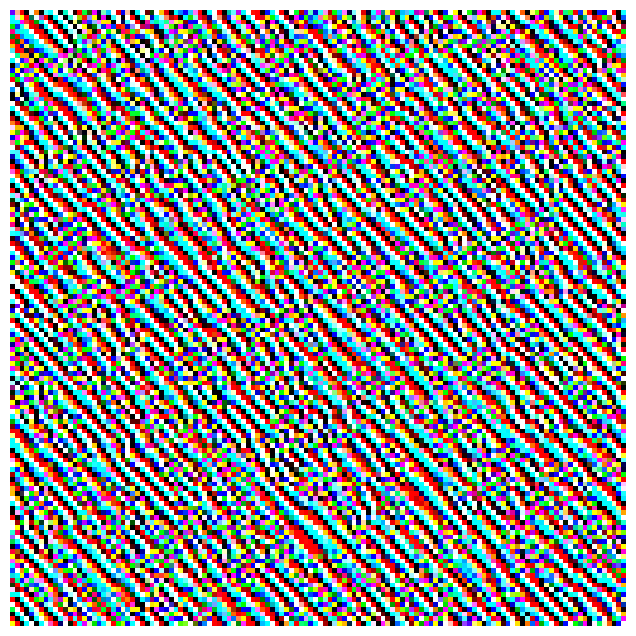

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, update_scale=0.1)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

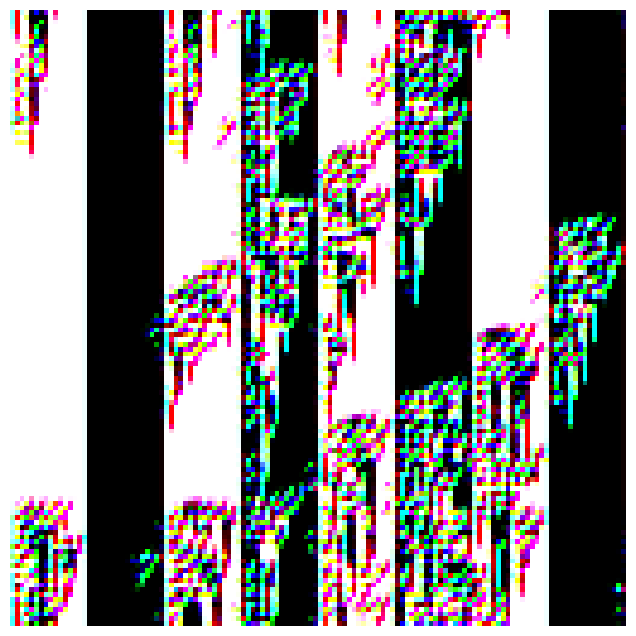

In [ ]:
def grow():
    kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
    result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=5, pct=0.5, update_scale=0.1)
    plt.figure(figsize=(8,8))
    plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
    plt.axis('off')
    plt.show()

grow()

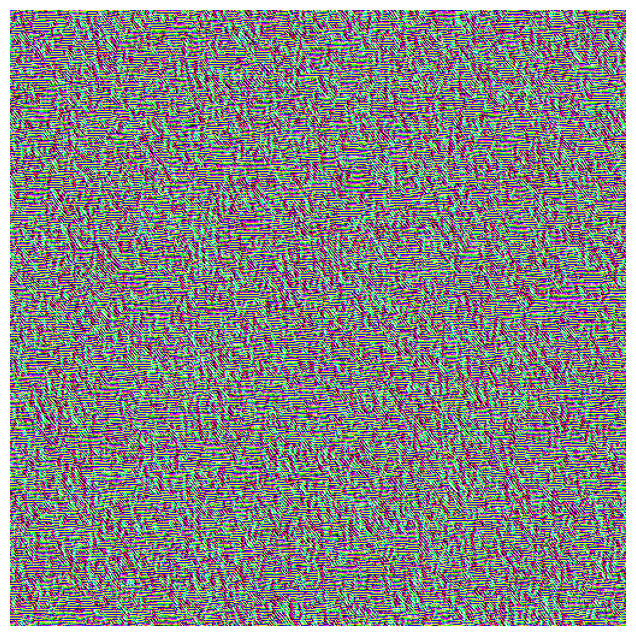

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=7, pct=0.5, update_scale=0.1)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

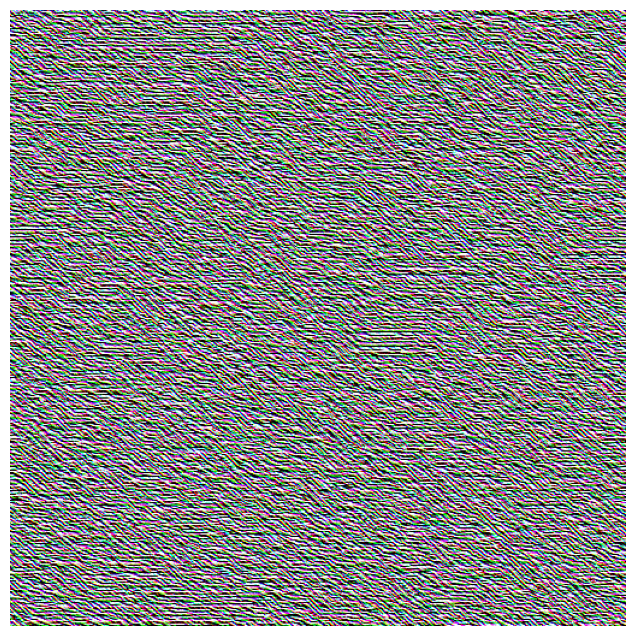

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=7, pct=0.5, update_scale=0.03)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

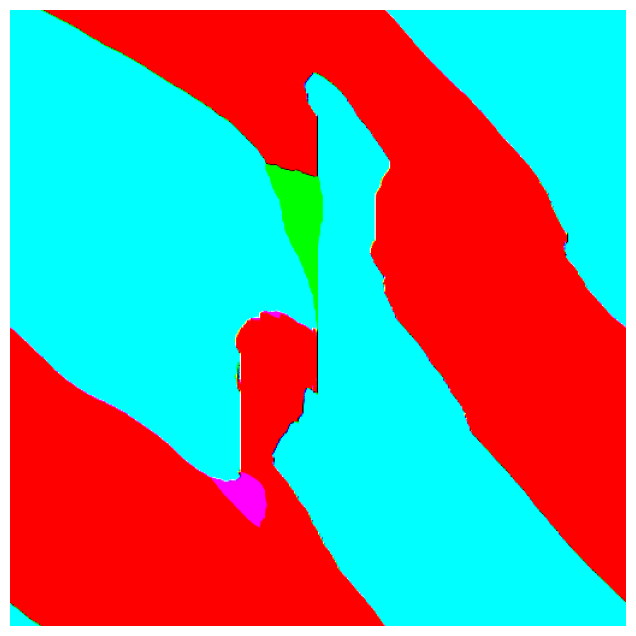

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=7, pct=0.5, update_scale=0.03)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

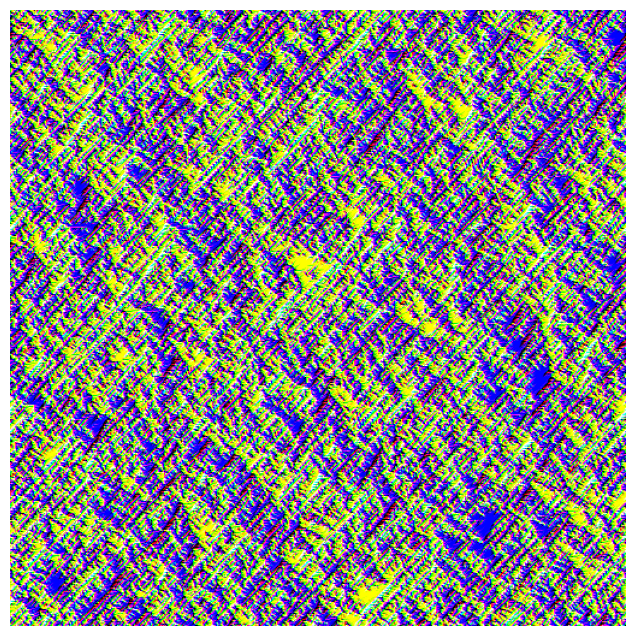

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=50, n_scales=7, pct=0.5, update_scale=0.03)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

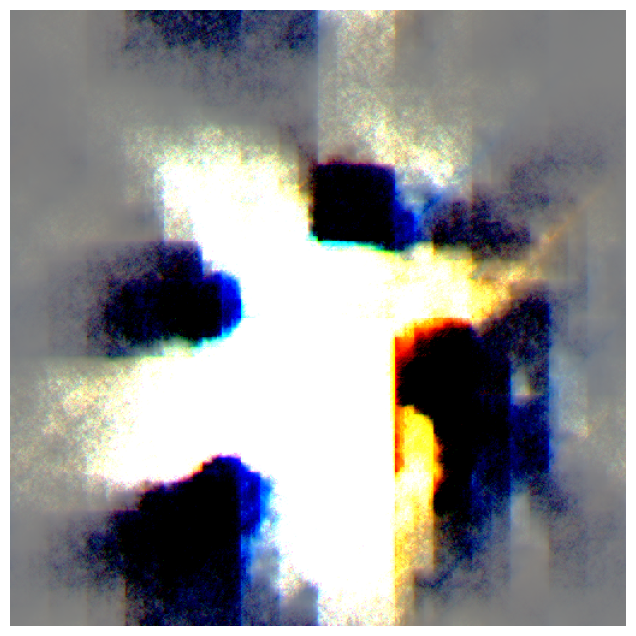

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=10, n_scales=7, pct=0.5, update_scale=0.03)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

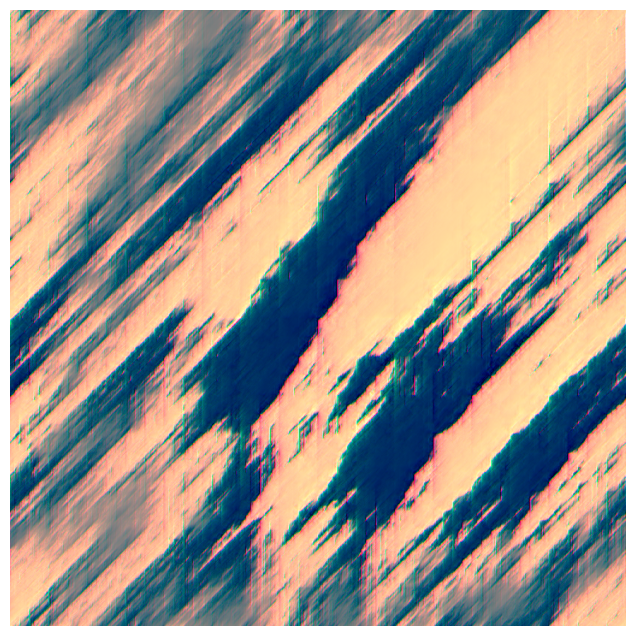

In [ ]:
kernel = torch.randn(3, 3, 3, 3)  # 3 output channels, 3 input channels, 3x3 kernel
result = multiscale_simulate_torch(8, kernel, n_steps_per_scale=20, n_scales=8, pct=0.5, update_scale=0.03)
plt.figure(figsize=(8,8))
plt.imshow(result * 0.5 + 0.5)  # Scale from [-1,1] to [0,1] for RGB display
plt.axis('off')
plt.show()

Save a video of the process and render like we did before please

##### 🤖Reply🤖<!-- SOLVEIT_SEPARATOR_7f3a9b2c -->

```python
def multiscale_simulate_torch_frames(init_sz, kernel, n_steps_per_scale=20, n_scales=8, pct=0.5, update_scale=0.03, device='cpu'):
    channels = kernel.shape[1]
    grid = init_grid_torch(init_sz, 'seed', device=device, channels=channels)
    frames = []
    
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale):
            grid = update_grid_torch(grid, kernel, pct, update_scale)
            frames.append(grid[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    
    return frames
```

```python
kernel = torch.randn(3, 3, 3, 3)
frames = multiscale_simulate_torch_frames(8, kernel, n_steps_per_scale=20, n_scales=8, pct=0.5, update_scale=0.03)
```

```python
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(8, 8))
ax.axis('off')
im = ax.imshow(frames[0], vmin=0, vmax=1)

def update(frame):
    im.set_array(frames[frame])
    return [im]

anim = FuncAnimation(fig, update, frames=len(frames), interval=50, blit=True)
plt.close()
HTML(anim.to_html5_video())
```

In [ ]:
def multiscale_simulate_torch_frames(init_sz, kernel, n_steps_per_scale=20, n_scales=8, pct=0.5, update_scale=0.03, device='cpu'):
    channels = kernel.shape[1]
    grid = init_grid_torch(init_sz, 'seed', device=device, channels=channels)
    frames = []
    
    for scale in range(n_scales):
        for _ in range(n_steps_per_scale * (scale//3 + 1)):
            grid = update_grid_torch(grid, kernel, pct, update_scale)
            frames.append(grid[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
        if scale < n_scales - 1:
            grid = upsample_grid_torch(grid)
    
    return frames

In [ ]:
kernel = torch.randn(3, 3, 3, 3)
frames = multiscale_simulate_torch_frames(8, kernel, n_steps_per_scale=20, n_scales=8, pct=0.5, update_scale=0.03)

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(8, 8))
ax.axis('off')
im = ax.imshow(frames[0], vmin=0, vmax=1)

def update(frame):
    im.set_array(frames[frame])
    return [im]

anim = FuncAnimation(fig, update, frames=len(frames), interval=50, blit=True)
plt.close()
HTML(anim.to_html5_video())